In [1]:
# установка необходимых библиотек с использованием файла requirements.txt, опубликованного в GitHub репозитории проекта

!pip install -r https://raw.githubusercontent.com/ponomarchuk-anna/Thesis/main/SAM%20fine-tuning/requirements.txt

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-install-mjx3bif9/segment-anything_5e5a9caeac8b447799d8cf6dec8d2cbc
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-install-mjx3bif9/segment-anything_5e5a9caeac8b447799d8cf6dec8d2cbc
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
# импорт библиотек, которые понадобятся в дальнейшем

import albumentations as A
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import torch
import torch.nn.functional as F

from pathlib import Path
from segment_anything import SamPredictor, sam_model_registry
from sklearn.metrics import matthews_corrcoef
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm

In [3]:
# предварительно все фотографии, обработанные с помощью написанных скриптов, были загружены на гугл диск

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
'''
класс для загрузки фотографий и соответствующих им масок для решения задачи сегментации изображения и выделения на нём одного класса
'''

class ImageDataset(Dataset):
    def __init__(self, root, split, current_class, transform=None):
        # путь к каждой из фотографий имеет вид root (корневая папка) / split (выборка, к которой она относится) / images / имя фотографии в формате .png
        self.image_directory = Path(root) / split / 'images'
        # путь к каждой из масок класса current_class имеет вид root (корневая папка) / split (выборка, к которой она относится) / masks / current_class / имя фотографии в формате .png
        self.mask_directory = Path(root) / split / 'masks' / current_class

        # имена всех фотографий из выборки (получаем через маски, так как не на всех фотографиях есть определённые классы)
        self.photos = [photo.stem for photo in self.mask_directory.glob('*.png')]
        # переданный набор аугментаций (None для валидационной и тестовой выборок)
        self.transform = transform

    def __len__(self):
        return len(self.photos)

    def __getitem__(self, index):
        # по индексу получаем имя очередного файла
        image_name = self.photos[index]
        # по полученному имени собираем пути до фотографии и до нужной маски
        image_path = self.image_directory / f'{image_name}.png'
        mask_path = self.mask_directory / f'{image_name}.png'

        # загружаем фотографию раны и преобразуем её в формат RGB вместо BGR
        image = cv2.imread(str(image_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # загружаем маску, преобразуем её в бинарный формат
        mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
        mask = (mask != 0).astype('uint8')

        # при необходимости применяем аугментации
        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image, mask = transformed['image'], transformed['mask']

        # преобразуем изображение в тензор
        # размерность изменяем на (color, height, width)
        # значения переводим в диапазон [0, 1]
        image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0

        # преобразуем маску в тензор
        # расширяем размерность до (1, height, width)
        mask = torch.from_numpy(mask).unsqueeze(0).float()

        return image, mask, image_name

In [5]:
# аугментации, которые будут применяться к обучающей выборке

train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.2),
    A.Affine(
        translate_percent={'x': (-0.02, 0.02), 'y': (-0.02, 0.02)},
        scale=(0.95, 1.05),
        rotate=(-10, 10),
        shear=(-5, 5),
        balanced_scale=True,
        p=0.5
    ),
    A.RandomBrightnessContrast(
        brightness_limit=0.1,
        contrast_limit=0.1,
        p=0.5
    ),
    A.HueSaturationValue(
        hue_shift_limit=10,
        sat_shift_limit=15,
        val_shift_limit=10,
        p=0.5
    ),
    A.GaussNoise(
        std_range=(0.01, 0.05),
        mean_range=(0.0, 0.0),
        p=0.5
    ),
    A.Blur(blur_limit=3, p=0.2),
    A.MedianBlur(blur_limit=3, p=0.2),
    A.GridDistortion(
        num_steps=4,
        distort_limit=0.02,
        p=0.5
    ),
    A.ElasticTransform(
        alpha=1,
        sigma=50,
        p=0.5
    ),
], additional_targets={'mask': 'mask'})

In [6]:
# загрузка данных

root = '/content/drive/MyDrive/Thesis/SAM fine-tuning/data'
current_class = 'ВсяРана' # класс, который модель будет учиться выделять на фотографиях
train_data = ImageDataset(root, 'train', current_class, transform=train_transform)
val_data = ImageDataset(root, 'val', current_class, transform=None)
test_data = ImageDataset(root, 'test', current_class, transform=None)

train_loader = DataLoader(train_data, batch_size=1, shuffle=True)
validation_loader = DataLoader(val_data, batch_size=1)
test_loader = DataLoader(test_data, batch_size=1)

In [7]:
'''
в контексте данной задачи нас интересуют две метрики: IoU и MCC
IoU оценивает, насколько площадь предсказанной маски совпадает с истинной
MCC (Matthews Correlation Coefficient) учитывает все возможные ситуации (TP, TN, FP и FN) и позволяет оценивать качество, когда классы несбалансированы
вычисление обеих метрик позволяет однозначно определить, насколько хорошо модель сегментирует фотографии
'''

def compute_IoU(predicted_logits, groundtruth_mask, threshold = 0.5):
    '''
    вычисляем значение метрики IoU
    predicted_logits - логиты, выдаваемые моделью
    groundtruth_mask - истинная бинарная маска
    threshold - значение, определяющее требуемую точность предсказания
    '''
    # преобразуем логиты в вероятности
    predicted_probabilities = torch.sigmoid(predicted_logits)
    # получаем предсказанную бинарную маску и истинную маску
    predicted_mask = (predicted_probabilities >= threshold).cpu().numpy().ravel()
    groundtruth_mask = (groundtruth_mask != 0).cpu().numpy().ravel()

    # находим пересечение и объединение
    intersection = np.logical_and(predicted_mask, groundtruth_mask).sum()
    union = np.logical_or(predicted_mask, groundtruth_mask).sum()

    IoU = (intersection + 1e-6) / (union + 1e-6)
    return IoU


def compute_MCC(predicted_logits, groundtruth_mask, threshold = 0.5):
    '''
    вычисляем коэффициент корреляции Мэтьюса MCC
    predicted_logits - логиты, выдаваемые моделью
    groundtruth_mask - истинная бинарная маска
    threshold - значение, определяющее требуемую точность предсказания
    '''
    # преобразуем логиты в вероятности
    predicted_probabilities = torch.sigmoid(predicted_logits)
    # получаем предсказанную бинарную маску и истинную маску
    predicted_mask = (predicted_probabilities >= threshold).cpu().numpy().ravel()
    groundtruth_mask = (groundtruth_mask != 0).cpu().numpy().ravel()

    return matthews_corrcoef(groundtruth_mask, predicted_mask)

In [8]:
# готовим модель к дообучению, скачиваем опубликованные в открытом доступе веса
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth &> /dev/null

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_type = 'vit_b'
checkpoint = 'sam_vit_b_01ec64.pth'
model = sam_model_registry[model_type](checkpoint=checkpoint)
model.to(device)

# дообучаем только декодер
for name, param in model.named_parameters():
    param.requires_grad = 'mask_decoder' in name

In [9]:
# настраиваем гиперпараметры для обучения
lr = 1e-4
weight_decay = 1e-7
num_epochs = 10 # небольшое значение, так как данный ноутбук лишь демонстрирует алгоритм дообучения SAM

optimizer = torch.optim.AdamW(model.mask_decoder.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

loss_fn = torch.nn.BCEWithLogitsLoss()

In [10]:
# оценка модели

def evaluate_model(model, loader, loss_fn, device, test=False, using_masks=True):
    '''
    функция для оценки качества модели на валидационном или тестовом датасете
    model - обученная модель
    loader - загрузчик данных (валидационный или тестовый)
    loss_fn - функция потерь
    device - устройство, на котором происходят вычисления
    test - логический флаг, равен True, если работаем с тестовым датасетом
    using_masks - логический флаг, равен True, если передаём истинные маски при дообучении
    '''

    # переводим модель в режим оценки
    model.eval()

    # списки для хранения потери и обеих метрик для каждой из фотографий
    losses, IoUs, MCCs = [], [], []

    with torch.no_grad():
        for image, mask, image_name in loader:
            image = image.to(device)
            mask = mask.to(device)

            # пропускаем фотографию через энкодер, а также получаем позиционные эмбеддинги
            image_embedding = model.image_encoder(image)
            positional_embedding = model.prompt_encoder.get_dense_pe()

            # изменяем размер маски для дообучения без сглаживания, чтобы сохранить дискретные значения
            resized_mask = F.interpolate(mask, size=(256,256), mode='nearest')

            # в любом случае будем подсказывать модели, что маска где-то на изображении
            height, width = image.shape[2], image.shape[3]
            bounding_box = torch.tensor([[0, 0, width, height]], device=device, dtype=torch.float)

            if using_masks:
                # получаем sparse_prompt (он задаётся точками или прямоугольниками) и dense_prompt (он задаётся маской)
                sparse_prompt, dense_prompt = model.prompt_encoder(
                    points=None,
                    boxes=bounding_box,
                    masks=resized_mask
                )
            else:
                # если маски модели не показываются, передаём только bounding_box, найденный ранее
                sparse_prompt, dense_prompt = model.prompt_encoder(
                    points=None,
                    boxes=bounding_box,
                    masks=None
                )

            # декодируем маску
            predicted_logits, _ = model.mask_decoder(
                image_embeddings=image_embedding,
                image_pe=positional_embedding,
                sparse_prompt_embeddings=sparse_prompt,
                dense_prompt_embeddings=dense_prompt,
                multimask_output=False
            )

            # вычисляем лосс и интересующие нас метрики (threshold=0.5)
            losses.append(loss_fn(predicted_logits, resized_mask).item())
            IoUs.append(compute_IoU(predicted_logits, resized_mask, threshold=0.5))
            MCCs.append(compute_MCC(predicted_logits, resized_mask, threshold=0.5))

            if test:
                # отображаем истинную маску и предсказанную маску на фотографии
                predicted_mask = (torch.sigmoid(predicted_logits) >= 0.5).float()
                predicted_mask = F.interpolate(predicted_mask, size=(mask.shape[2], mask.shape[3]), mode='nearest').squeeze().cpu().numpy()

                image = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
                fig, axes = plt.subplots(1, 2, figsize=(12, 6))

                axes[0].imshow(image)
                axes[0].imshow(mask.squeeze().cpu().numpy(), cmap='Reds', alpha=0.5)
                axes[0].set_title('Истинная маска')
                axes[0].axis('off')

                axes[1].imshow(image)
                axes[1].imshow(predicted_mask, cmap='Reds', alpha=0.5)
                axes[1].set_title('Предсказанная маска')
                axes[1].axis('off')

                plt.tight_layout()
                plt.show()

    # возвращаем средние значения функции потерь, метрики IoU и MCC
    return np.mean(losses), np.mean(IoUs), np.mean(MCCs)

In [11]:
# обучаем модель, показывая ей, где искать маски

# создаём папку для хранения весов обученной модели
os.makedirs('checkpoints', exist_ok=True)

for epoch in tqdm(range(num_epochs)):
    # переводим модель в режим обучения
    model.train()

    # списки для хранения лосса и обеих метрик для каждой из фотографий
    train_losses, train_IoUs, train_MCCs = [], [], []

    for image, mask, image_name in train_loader:
        image = image.to(device)
        mask = mask.to(device)

        # пропускаем фотографию через энкодер, а также получаем позиционные эмбеддинги
        with torch.no_grad():
            image_embedding = model.image_encoder(image)
            positional_embedding = model.prompt_encoder.get_dense_pe()

            # изменяем размер маски для дообучения без сглаживания, чтобы сохранить дискретную значения
            resized_mask = F.interpolate(mask, size=(256,256), mode='nearest')

            # в любом случае будем подсказывать модели, что маска где-то на изображении
            height, width = image.shape[2], image.shape[3]
            bounding_box = torch.tensor([[0, 0, width, height]], device=device, dtype=torch.float)

            # получаем sparse_prompt (он задаётся точками или прямоугольниками) и dense_prompt (он задаётся маской)
            sparse_prompt, dense_prompt = model.prompt_encoder(
                points=None,
                boxes=bounding_box,
                masks=resized_mask
            )

        # декодируем маску
        predicted_logits, _ = model.mask_decoder(
            image_embeddings=image_embedding,
            image_pe=positional_embedding,
            sparse_prompt_embeddings=sparse_prompt,
            dense_prompt_embeddings=dense_prompt,
            multimask_output=False
        )

        # вычисляем лосс и интересующие нас метрики
        loss = loss_fn(predicted_logits, resized_mask)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        scheduler.step()

        train_losses.append(loss.item())
        train_IoUs.append(compute_IoU(predicted_logits, resized_mask, threshold=0.2))
        train_MCCs.append(compute_MCC(predicted_logits, resized_mask, threshold=0.2))

    # считаем средние значения функции потерь, а также метрик IoU и MCC
    mean_train_loss = np.mean(train_losses)
    mean_train_IoU = np.mean(train_IoUs)
    mean_train_MCC = np.mean(train_MCCs)

    mean_validation_loss, mean_validation_IoU, mean_validation_MCC = evaluate_model(model, validation_loader, loss_fn, device, test=False, using_masks=True)

    print(f'\nЭпоха {epoch}:\n\t Обучающая выборка: loss={mean_train_loss:.4f}, IoU={mean_train_IoU:.4f}, MCC={mean_train_MCC:.4f}\n\t Валидационная выборка: loss={mean_validation_loss:.4f}, IoU={mean_validation_IoU:.4f}, MCC={mean_validation_MCC:.4f}')

    # сохраняем веса модели
    path_to_checkpoint = f'checkpoints/with_masks_epoch_{epoch}.pth'
    torch.save(model.state_dict(), path_to_checkpoint)

  0%|          | 0/10 [00:00<?, ?it/s]


Эпоха 0:
	 Обучающая выборка: loss=0.1856, IoU=0.0016, MCC=-0.0032
	 Валидационная выборка: loss=0.1103, IoU=0.0000, MCC=0.0000


 10%|█         | 1/10 [01:27<13:03, 87.08s/it]


Эпоха 1:
	 Обучающая выборка: loss=0.0892, IoU=0.1675, MCC=0.2570
	 Валидационная выборка: loss=0.0648, IoU=0.0385, MCC=0.1395


 20%|██        | 2/10 [02:04<07:40, 57.61s/it]


Эпоха 2:
	 Обучающая выборка: loss=0.0377, IoU=0.5279, MCC=0.6493
	 Валидационная выборка: loss=0.0201, IoU=0.6787, MCC=0.8019


 30%|███       | 3/10 [02:42<05:40, 48.68s/it]


Эпоха 3:
	 Обучающая выборка: loss=0.0349, IoU=0.5723, MCC=0.7075
	 Валидационная выборка: loss=0.0339, IoU=0.6445, MCC=0.7761


 40%|████      | 4/10 [03:20<04:27, 44.58s/it]


Эпоха 4:
	 Обучающая выборка: loss=0.0312, IoU=0.6070, MCC=0.7447
	 Валидационная выборка: loss=0.0191, IoU=0.7332, MCC=0.8436


 50%|█████     | 5/10 [03:59<03:32, 42.56s/it]


Эпоха 5:
	 Обучающая выборка: loss=0.0174, IoU=0.6794, MCC=0.7973
	 Валидационная выборка: loss=0.0174, IoU=0.6920, MCC=0.8174


 60%|██████    | 6/10 [04:39<02:46, 41.71s/it]


Эпоха 6:
	 Обучающая выборка: loss=0.0116, IoU=0.7626, MCC=0.8556
	 Валидационная выборка: loss=0.0163, IoU=0.7190, MCC=0.8354


 70%|███████   | 7/10 [05:20<02:04, 41.53s/it]


Эпоха 7:
	 Обучающая выборка: loss=0.0093, IoU=0.7938, MCC=0.8801
	 Валидационная выборка: loss=0.0116, IoU=0.7800, MCC=0.8750


 80%|████████  | 8/10 [06:03<01:23, 41.81s/it]


Эпоха 8:
	 Обучающая выборка: loss=0.0071, IoU=0.8281, MCC=0.9028
	 Валидационная выборка: loss=0.0130, IoU=0.7664, MCC=0.8681


 90%|█████████ | 9/10 [06:44<00:41, 41.71s/it]


Эпоха 9:
	 Обучающая выборка: loss=0.0069, IoU=0.8379, MCC=0.9084
	 Валидационная выборка: loss=0.0097, IoU=0.8301, MCC=0.9047


100%|██████████| 10/10 [07:26<00:00, 44.67s/it]


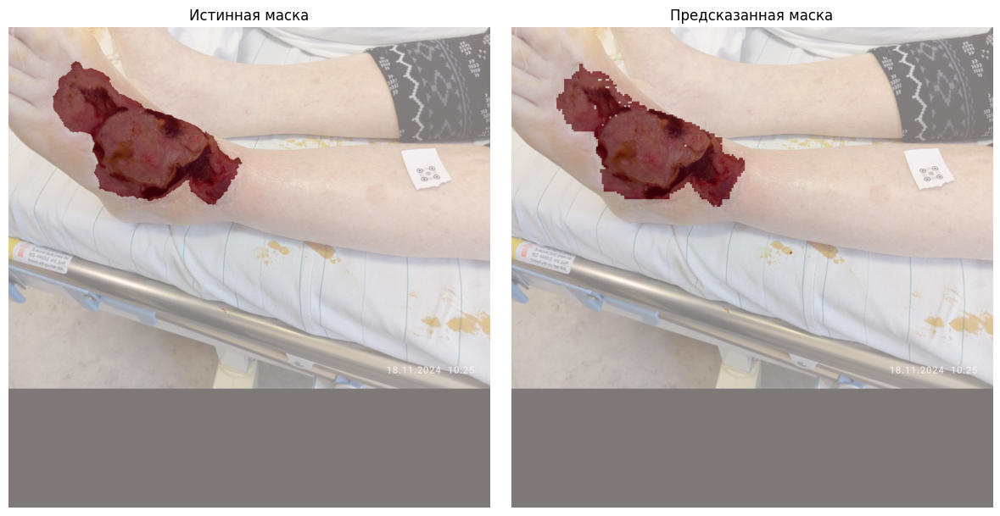

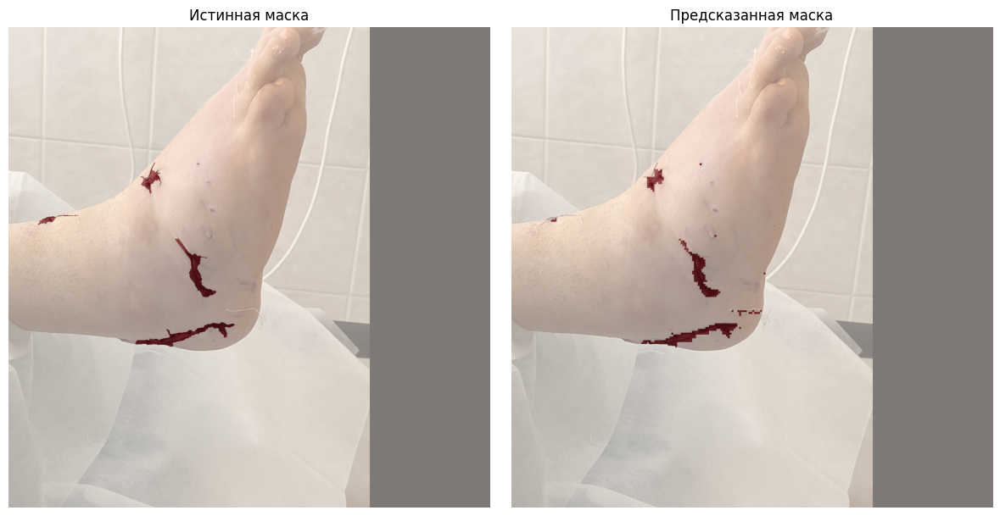

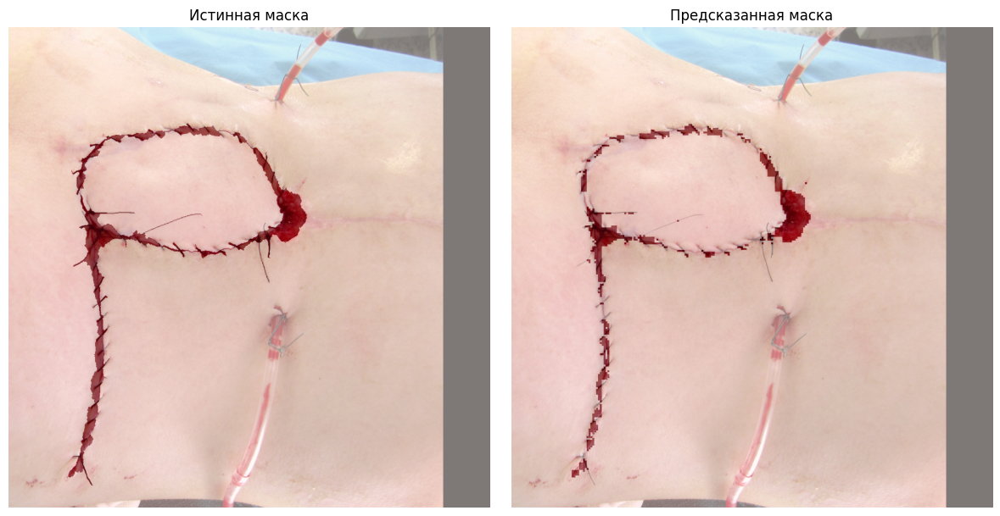

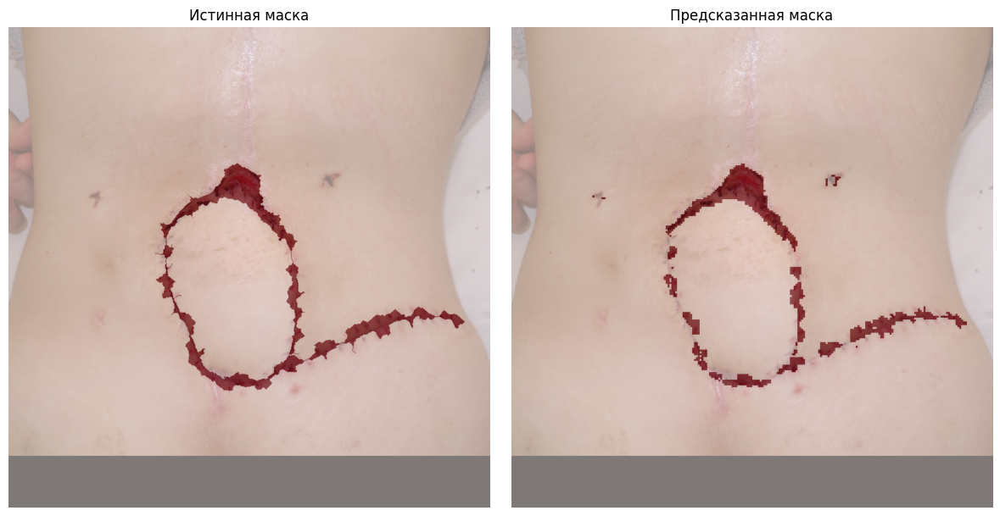

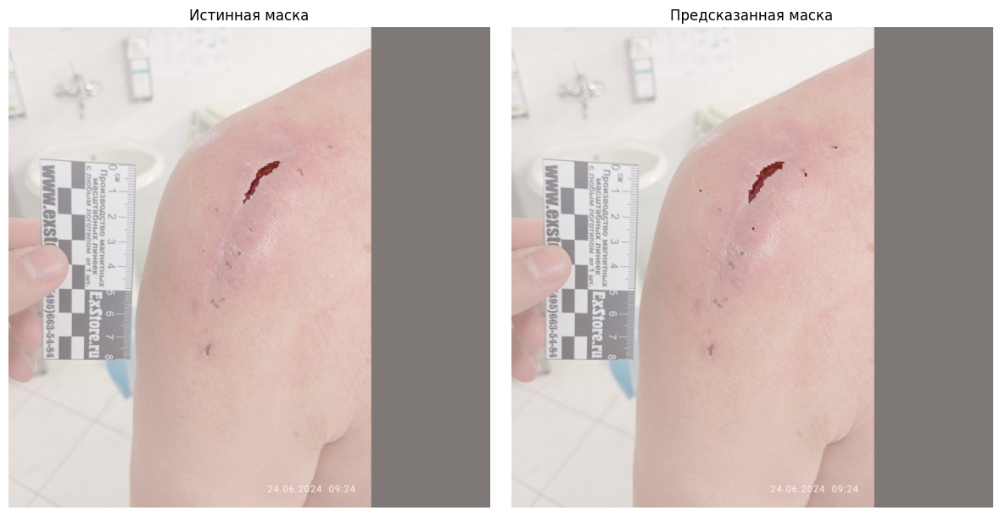

...

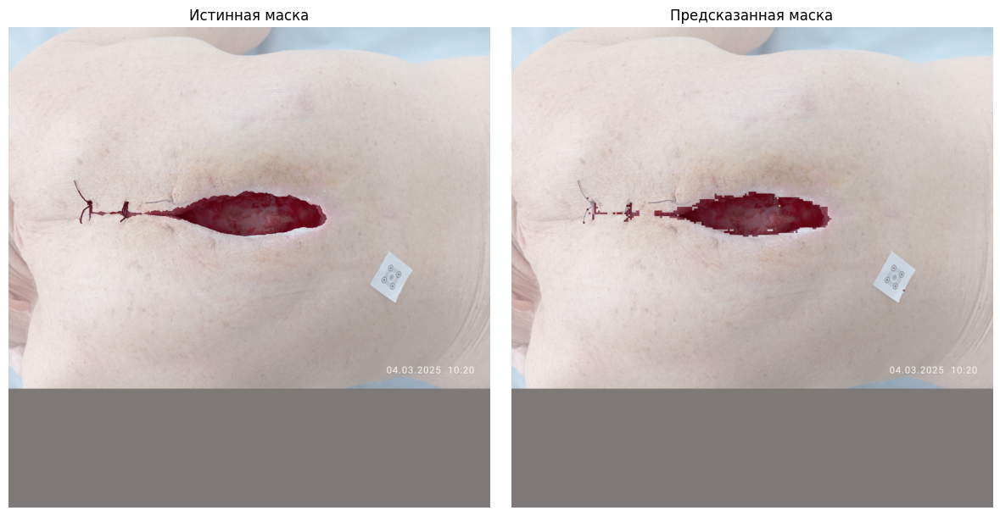

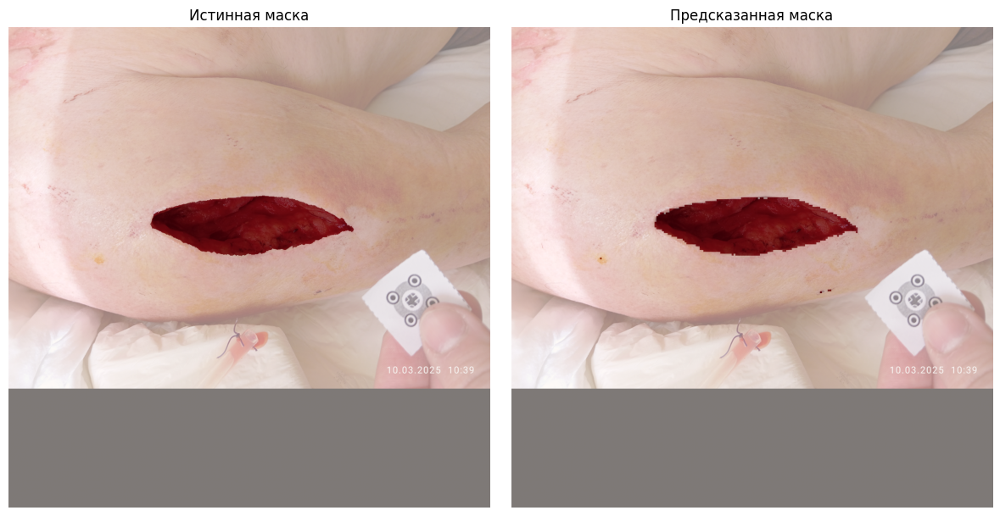

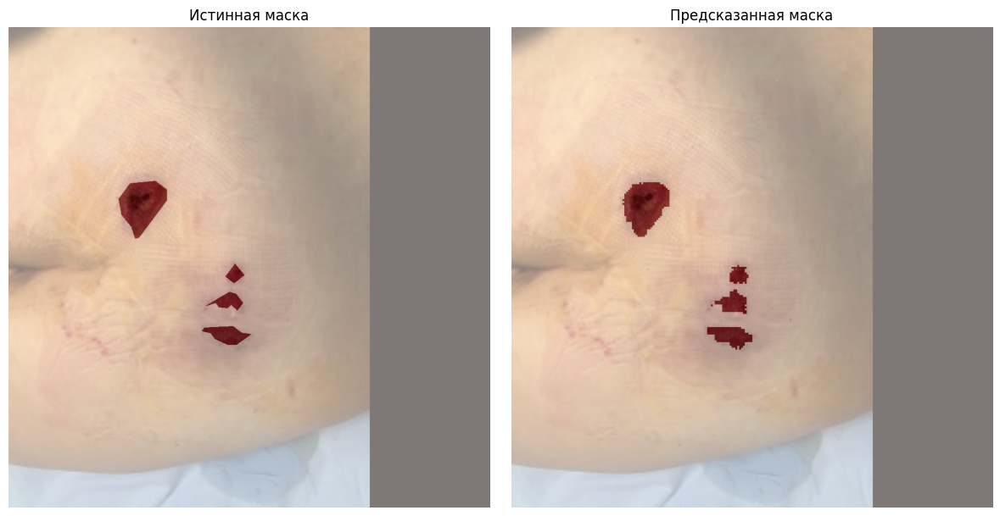

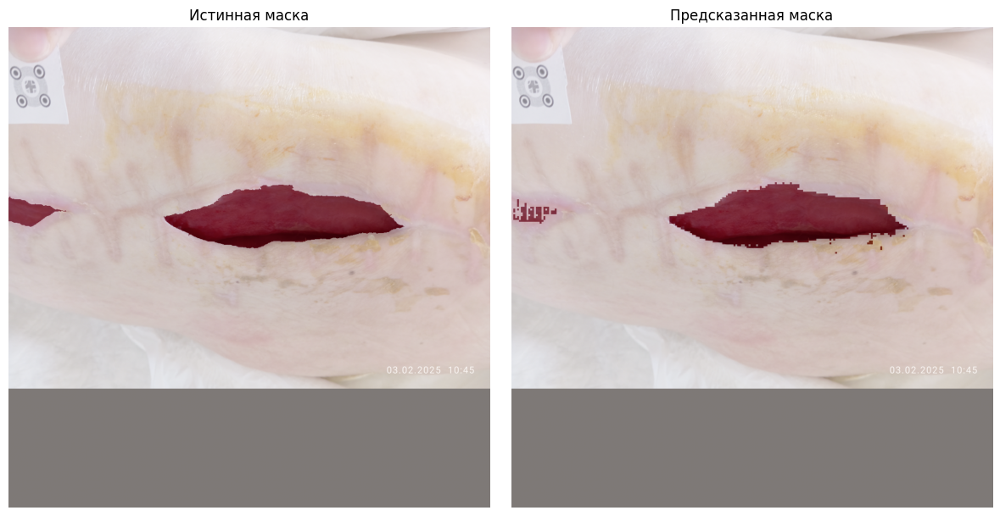

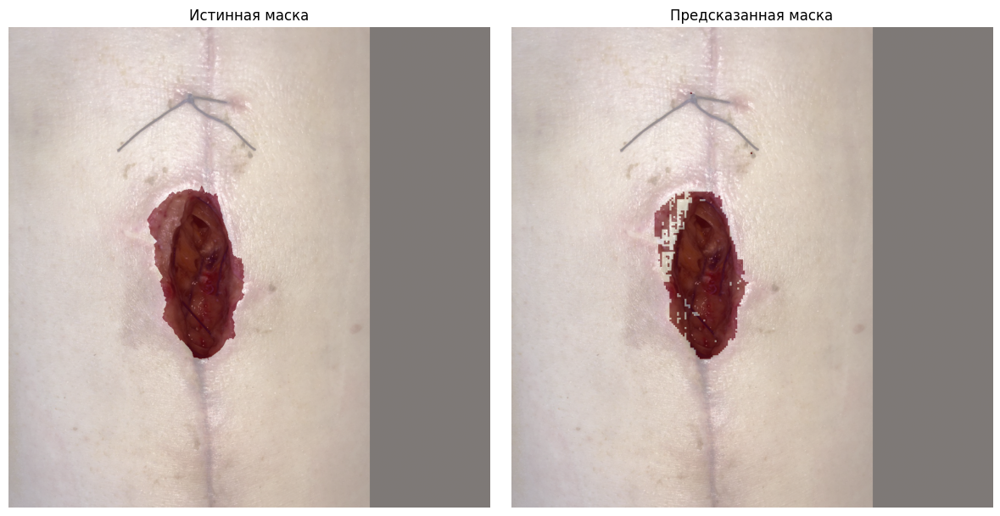

Тестовая выборка: loss=0.0103, IoU=0.8270, MCC=0.9022


In [12]:
# измеряем качество на тестовой выборке в том случае, если пользователь передаёт маску в качестве подсказки
mean_test_loss, mean_test_IoU, mean_test_MCC = evaluate_model(model, test_loader, loss_fn, device, test=True, using_masks=True)
print(f'Тестовая выборка: loss={mean_test_loss:.4f}, IoU={mean_test_IoU:.4f}, MCC={mean_test_MCC:.4f}')

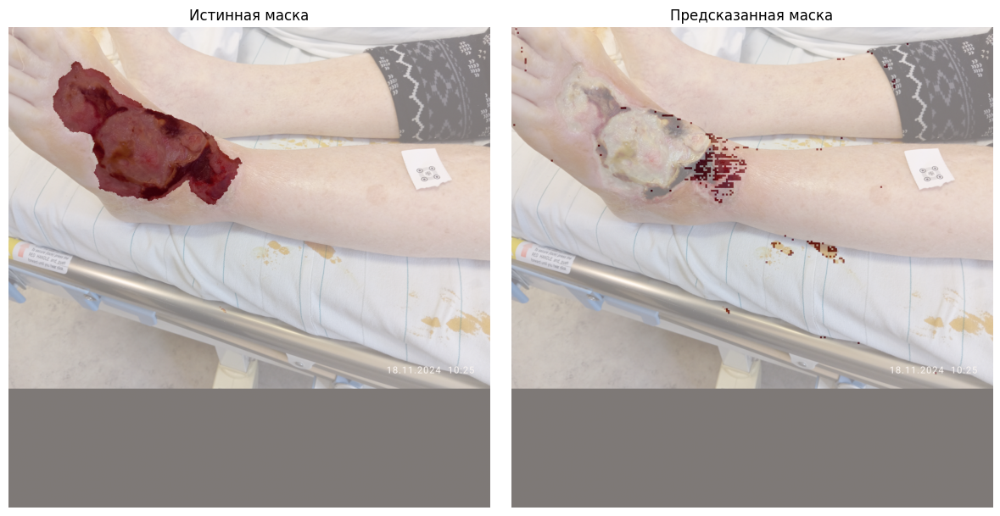

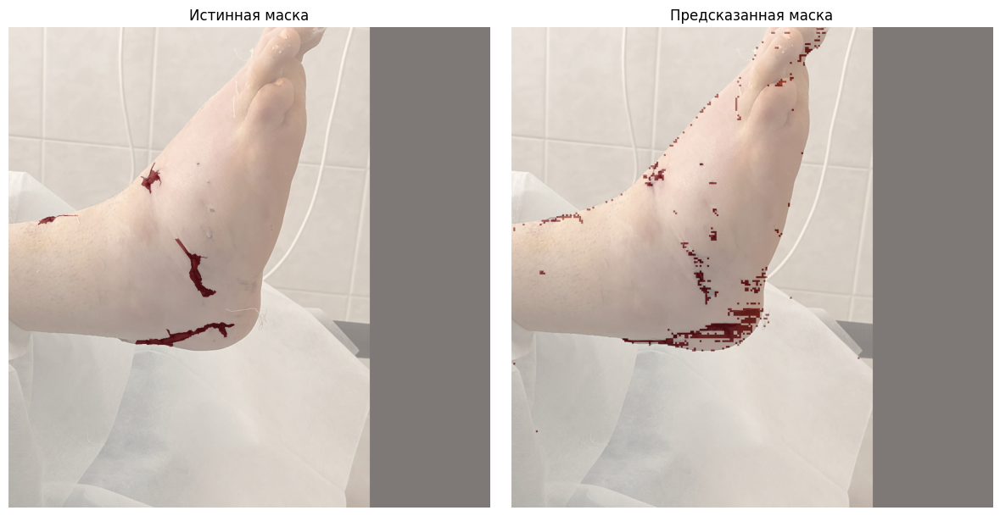

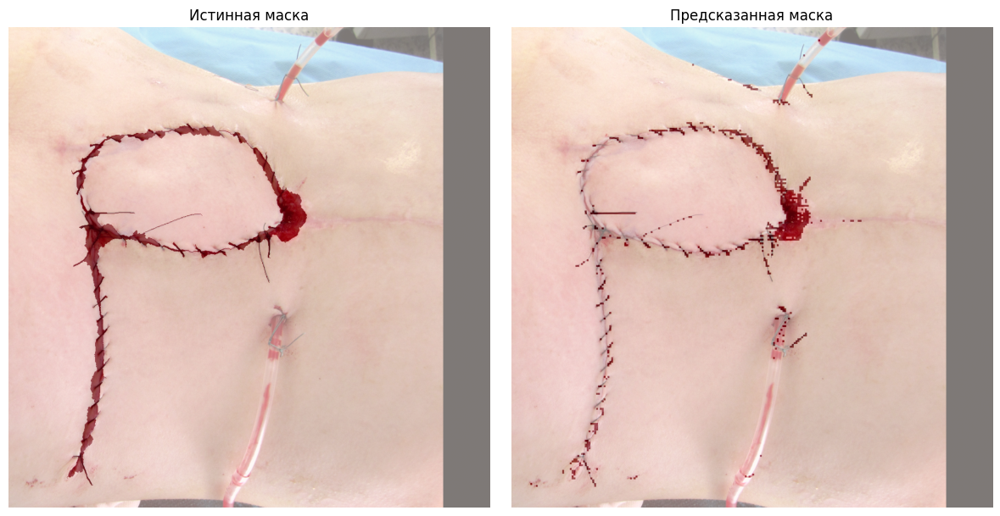

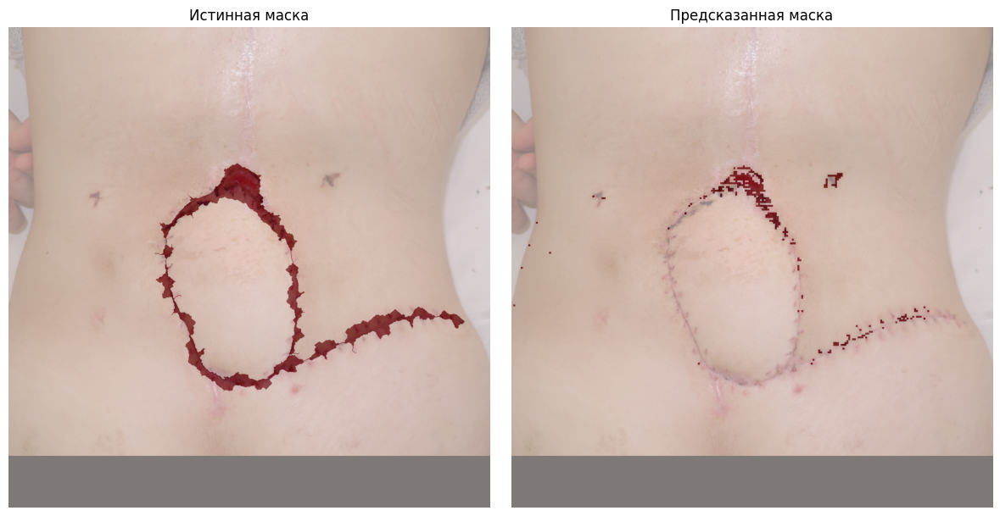

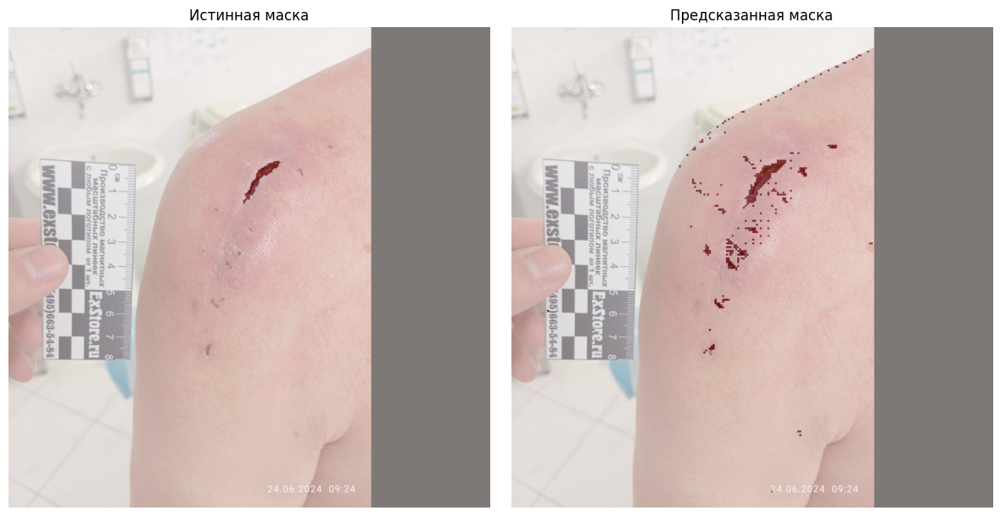

...

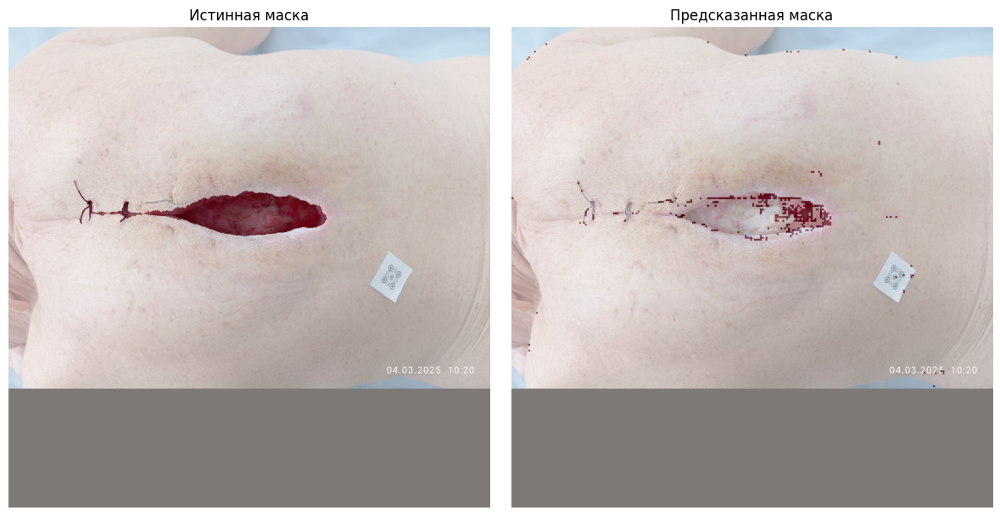

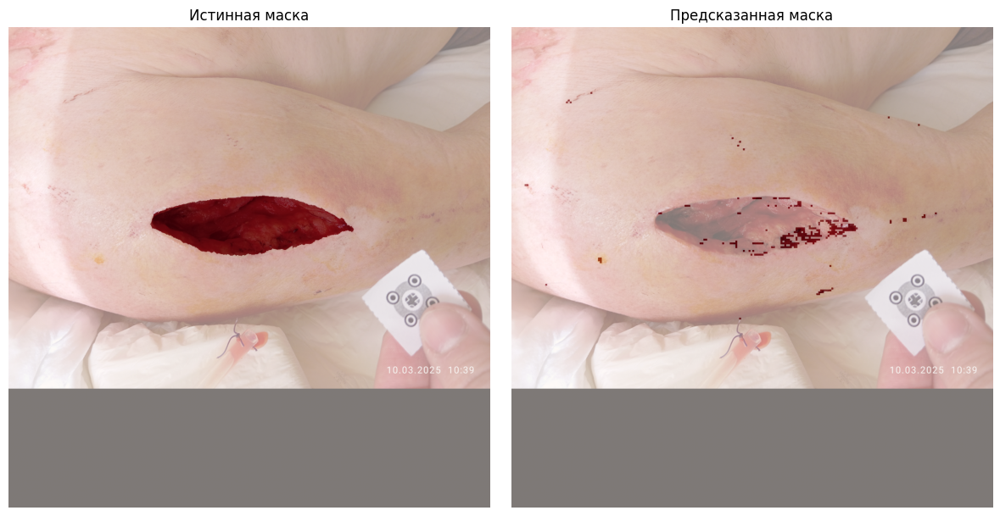

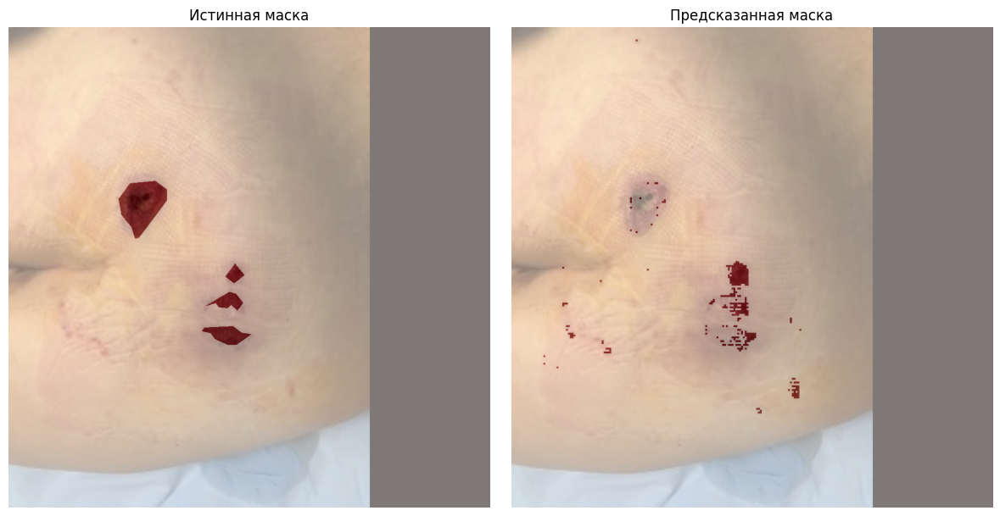

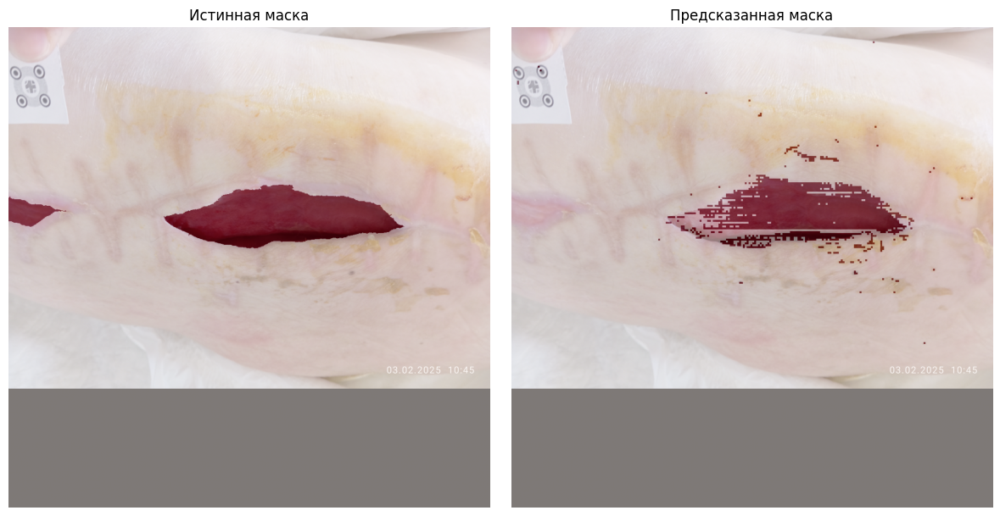

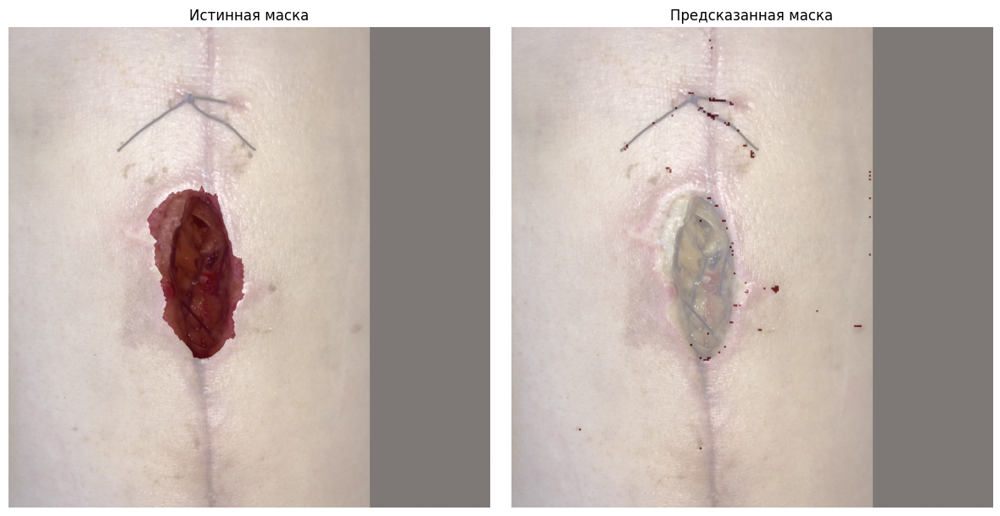

Тестовая выборка: loss=0.0988, IoU=0.1829, MCC=0.3269


In [13]:
# измеряем качество на тестовой выборке в том случае, если пользователь не передаёт маску в качестве подсказки
mean_test_loss, mean_test_IoU, mean_test_MCC = evaluate_model(model, test_loader, loss_fn, device, test=True, using_masks=False)
print(f'Тестовая выборка: loss={mean_test_loss:.4f}, IoU={mean_test_IoU:.4f}, MCC={mean_test_MCC:.4f}')